# Gastric Cancer Detection

# Step 1: Loading the Data

We begin by importing the necessary libraries and loading the dataset. This step ensures that the data is accessible and we can begin analyzing its structure.

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from ipywidgets import interact
import ipywidgets as widgets
import plotly.graph_objects as go
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

In [2]:
gc_data = pd.read_csv('../datasets/MainDataset/gastric_cancer_detection_dataset.csv')
pd.set_option('display.max_columns', None)
pd.set_option('display.precision', 4)

gc_data.head()

,age,gender,ethnicity,geographical_location,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,dietary_habits,existing_conditions,endoscopic_images,biopsy_results,ct_scan,mature_mirna_acc,mature_mirna_id,target_symbol,target_entrez,target_ensembl,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan,predicted.sum,all.sum,label
0,43,Male,Ethnicity_A,Other,1,0,0,0,Low_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,MIR123_1,TP53,5034,1946626,0.3813,0.1870,0.7864,0.2048,0.5619,0.4382,0.2836,0.9282,4.3243,7.6668,0
1,86,Female,Ethnicity_B,California,1,0,0,1,High_Salt,Diabetes,Normal,Negative,Negative,MIR123,MIR234_2,TP53,6901,1503178,0.9586,0.4933,0.9640,0.4980,0.9856,0.1446,0.3754,0.1036,7.9677,1.4833,0
2,68,Male,Ethnicity_A,California,0,1,1,0,High_Salt,NaN,Normal,Negative,Negative,MIR345,MIR345_3,KRAS,4014,1787909,0.2695,0.5736,0.6669,0.5404,0.9059,0.8273,0.3509,0.1669,3.7487,3.0468,0
3,57,Female,Ethnicity_A,Other,0,0,0,1,High_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,MIR123_1,KRAS,7351,1310766,0.3723,0.2614,0.9495,0.1342,0.4299,0.9352,0.7947,0.8670,5.4783,8.8113,0
4,33,Male,Ethnicity_A,California,0,1,1,0,High_Salt,Diabetes,Abnormal,Negative,Negative,MIR345,MIR123_1,CDH1,7982,1277058,0.9747,0.7545,0.2632,0.8768,0.6508,0.3377,0.4275,0.9158,1.8092,0.3946,0


In [3]:
gc_data.columns

Index(['age', 'gender', 'ethnicity', 'geographical_location', 'family_history',
       'smoking_habits', 'alcohol_consumption',
       'helicobacter_pylori_infection', 'dietary_habits',
       'existing_conditions', 'endoscopic_images', 'biopsy_results', 'ct_scan',
       'mature_mirna_acc', 'mature_mirna_id', 'target_symbol', 'target_entrez',
       'target_ensembl', 'diana_microt', 'elmmo', 'microcosm', 'miranda',
       'mirdb', 'pictar', 'pita', 'targetscan', 'predicted.sum', 'all.sum',
       'label'],
      dtype='object')

## Understanding the Dataset (Full Explanation)

In this step, we explain each feature in the dataset in a way that is accessible even to those without a background in medicine, biology, or genetics.

### 🔹 Demographic & Lifestyle Information

These features capture general information about the patient and their habits, which may influence the risk of developing gastric cancer.

- **age** *(Numerical)*: The age of the patient at the time of diagnosis or evaluation.
- **gender** *(Categorical: Male/Female)*: The biological sex of the patient.
- **ethnicity** *(Categorical)*: The ethnic background of the patient (e.g., Asian, Caucasian).
- **geographical_location** *(Categorical)*: The country or region where the data was collected. Environmental or regional factors can influence cancer rates.
- **family_history** *(Binary: Yes/No)*: Whether the patient has a family history of cancer, which may increase their risk.
- **smoking_habits** *(Binary: Yes/No)*: Indicates if the patient is a smoker, a known risk factor for gastric and many other cancers.
- **alcohol_consumption** *(Binary: Yes/No)*: Indicates whether the patient consumes alcohol, which can also be a risk factor.
- **dietary_habits** *(Categorical)*: Describes the patient’s eating patterns—such as diets high in salt—which can affect cancer risk.

### 🔹 Medical History & Diagnostic Results

These features involve the patient's medical history and results from medical tests that are commonly used to detect cancer.

- **existing_conditions** *(Categorical)*: Any pre-existing medical conditions like diabetes, gastritis, or hypertension, which may be related to overall health and cancer risk.
- **helicobacter_pylori_infection** *(Binary: Yes/No)*: Indicates whether the patient is infected with *Helicobacter pylori*, a bacteria strongly linked to stomach cancer.
- **endoscopic_images** *(Categorical: Normal/Abnormal)*: The result of an endoscopy, which uses a camera to look inside the stomach. An abnormal result may show signs of tumors or ulcers.
- **biopsy_results** *(Categorical: Positive/Negative)*: Whether a tissue sample taken from the stomach tested positive (cancerous) or negative (non-cancerous).
- **ct_scan** *(Categorical: Normal/Abnormal)*: Results from a CT (computed tomography) scan. Abnormal results may indicate the presence of a tumor.

### 🔹 Genetic & Molecular Data (miRNA and Target Genes)

These columns relate to *microRNAs (miRNAs)*, which are small non-coding RNA molecules that regulate gene expression. Changes in miRNA behavior can be linked to cancer. Each miRNA can bind to target genes and affect how much of the protein is produced.

- **mature_mirna_acc** *(Categorical)*: A unique identifier (accession number) for the mature miRNA.
- **mature_mirna_id** *(Categorical)*: The name of the mature miRNA, such as *hsa-miR-21*, where "hsa" refers to humans.
- **target_symbol** *(Categorical)*: The shorthand symbol for a gene that the miRNA might regulate.
- **target_entrez** *(Categorical)*: A unique numerical ID for the gene in the NCBI Entrez database.
- **target_ensembl** *(Categorical)*: A unique identifier for the gene in the Ensembl database, another widely used genomic database.

### 🔹 miRNA–Gene Interaction Prediction Scores

These columns come from bioinformatics tools that predict whether a miRNA can interact with a specific gene. Each tool uses different algorithms or biological data to make these predictions. Higher scores generally indicate stronger or more confident interactions.

- **diana_microt** *(Numerical)*: Score from the DIANA-microT algorithm.
- **elmmo** *(Numerical)*: Confidence score from the ElMMo tool.
- **microcosm** *(Numerical)*: Score from the Microcosm prediction database.
- **miranda** *(Numerical)*: Score from the MiRanda alignment-based algorithm.
- **mirdb** *(Numerical)*: Confidence score from the miRDB database.
- **pictar** *(Numerical)*: Predicted interaction score from the PicTar algorithm.
- **pita** *(Numerical)*: Score based on how accessible a gene is to a miRNA (from the PITA algorithm).
- **targetscan** *(Numerical)*: Score from TargetScan, one of the most widely used miRNA target prediction tools.

- **predicted.sum** *(Numerical)*: Sum of scores across prediction algorithms. Indicates overall prediction confidence from computational tools.
- **all.sum** *(Numerical)*: May include additional scoring beyond prediction tools, such as experimentally validated data.

### 🎯 Target Variable

- **label** *(Binary: 1 = Cancer, 0 = No Cancer)*: This is the **output** or **label** column we aim to predict using machine learning. It tells whether the patient has been diagnosed with gastric cancer.

---

### 🧠 Summary
This dataset combines:
- Basic demographic and lifestyle risk factors
- Clinical and diagnostic test results
- Advanced genomic data related to miRNAs and their gene targets

Together, this rich set of features allows for a powerful machine learning model that can potentially detect gastric cancer based on diverse types of input data.



In [4]:
gc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 212354 entries, 0 to 212353
Data columns (total 29 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   age                            212354 non-null  int64  
 1   gender                         212354 non-null  object 
 2   ethnicity                      212354 non-null  object 
 3   geographical_location          212354 non-null  object 
 4   family_history                 212354 non-null  int64  
 5   smoking_habits                 212354 non-null  int64  
 6   alcohol_consumption            212354 non-null  int64  
 7   helicobacter_pylori_infection  212354 non-null  int64  
 8   dietary_habits                 212354 non-null  object 
 9   existing_conditions            169868 non-null  object 
 10  endoscopic_images              212354 non-null  object 
 11  biopsy_results                 212354 non-null  object 
 12  ct_scan                       

## Dropping some unuseful data

In [5]:
gc_data.drop(columns =['mature_mirna_id', 'target_entrez', 'target_ensembl', 'predicted.sum', 'all.sum'], inplace = True)

In [6]:
categorical_columns = gc_data.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_columns = gc_data.select_dtypes(include=['int64', 'float64']).columns.tolist()
binary_columns = ["family_history", "smoking_habits", "alcohol_consumption", "helicobacter_pylori_infection", "label"]
gc_data_cat = gc_data[categorical_columns]
gc_data_num = gc_data[numerical_columns]
gc_data_bin = gc_data[binary_columns]

In [7]:
gc_data_cat.head()

,gender,ethnicity,geographical_location,dietary_habits,existing_conditions,endoscopic_images,biopsy_results,ct_scan,mature_mirna_acc,target_symbol
0,Male,Ethnicity_A,Other,Low_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,TP53
1,Female,Ethnicity_B,California,High_Salt,Diabetes,Normal,Negative,Negative,MIR123,TP53
2,Male,Ethnicity_A,California,High_Salt,NaN,Normal,Negative,Negative,MIR345,KRAS
3,Female,Ethnicity_A,Other,High_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,KRAS
4,Male,Ethnicity_A,California,High_Salt,Diabetes,Abnormal,Negative,Negative,MIR345,CDH1


In [8]:
gc_data_num.head()

,age,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan,label
0,43,1,0,0,0,0.3813,0.1870,0.7864,0.2048,0.5619,0.4382,0.2836,0.9282,0
1,86,1,0,0,1,0.9586,0.4933,0.9640,0.4980,0.9856,0.1446,0.3754,0.1036,0
2,68,0,1,1,0,0.2695,0.5736,0.6669,0.5404,0.9059,0.8273,0.3509,0.1669,0
3,57,0,0,0,1,0.3723,0.2614,0.9495,0.1342,0.4299,0.9352,0.7947,0.8670,0
4,33,0,1,1,0,0.9747,0.7545,0.2632,0.8768,0.6508,0.3377,0.4275,0.9158,0


In [9]:
gc_data_bin.head()

,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,label
0,1,0,0,0,0
1,1,0,0,1,0
2,0,1,1,0,0
3,0,0,0,1,0
4,0,1,1,0,0


In [10]:
gc_data.isnull().sum()

age                                  0
gender                               0
ethnicity                            0
geographical_location                0
family_history                       0
smoking_habits                       0
alcohol_consumption                  0
helicobacter_pylori_infection        0
dietary_habits                       0
existing_conditions              42486
endoscopic_images                    0
biopsy_results                       0
ct_scan                              0
mature_mirna_acc                     0
target_symbol                        0
diana_microt                         0
elmmo                                0
microcosm                            0
miranda                              0
mirdb                                0
pictar                               0
pita                                 0
targetscan                           0
label                                0
dtype: int64

**We have 42486 missing values in existing_conditions column**

Now we have another question... does any column have missing data but is labeled "missing" or maybe "no data" or somthing, lets check

In [11]:
for col in gc_data_cat:
    print(gc_data[col].value_counts())
    print("----------------------")

gender
Male      148706
Female     63648
Name: count, dtype: int64
----------------------
ethnicity
Ethnicity_A    127571
Ethnicity_B     63569
Ethnicity_C     21214
Name: count, dtype: int64
----------------------
geographical_location
California    169603
Other          42751
Name: count, dtype: int64
----------------------
dietary_habits
High_Salt    169805
Low_Salt      42549
Name: count, dtype: int64
----------------------
existing_conditions
Chronic Gastritis    106309
Diabetes              63559
Name: count, dtype: int64
----------------------
endoscopic_images
Normal      148523
Abnormal     63831
Name: count, dtype: int64
----------------------
biopsy_results
Negative    191223
Positive     21131
Name: count, dtype: int64
----------------------
ct_scan
Negative    169740
Positive     42614
Name: count, dtype: int64
----------------------
mature_mirna_acc
MIR123    148596
MIR234     42474
MIR345     21284
Name: count, dtype: int64
----------------------
target_symbol
TP53    10

In [12]:
for col in gc_data_bin:
    print(gc_data_bin[col].value_counts())
    print("----------------------")

family_history
0    148528
1     63826
Name: count, dtype: int64
----------------------
smoking_habits
0    127592
1     84762
Name: count, dtype: int64
----------------------
alcohol_consumption
0    106309
1    106045
Name: count, dtype: int64
----------------------
helicobacter_pylori_infection
0    159378
1     52976
Name: count, dtype: int64
----------------------
label
0    191395
1     20959
Name: count, dtype: int64
----------------------


# Step 2: Exploring Categorical Features and Missing Values

To better understand the dataset, we explored the distribution of values in key categorical features and identified missing data.

### 📌 Key Findings:

- **Gender**: Mostly Male (approx. 70%)
- **Ethnicity**: Majority from Ethnicity_A, with smaller groups from B and C
- **Geographical Location**: Most data collected from California
- **Dietary Habits**: Skewed heavily toward High Salt diet
- **Existing Conditions**:
  - Chronic Gastritis and Diabetes are present
  - ⚠️ 42,486 missing values (needs special handling)
- **Endoscopic Images**: Majority Normal, some Abnormal
- **Biopsy and CT Scan**: Show medical screening results (mostly Negative)
- **miRNA and Target Genes**: Show the interaction records for different genes and miRNAs
- **Risk Factors** (Family History, Smoking, Alcohol, H. pylori infection): Provided as binary (0/1)
- **Label**: Highly imbalanced — far more non-cancer cases (0) than cancer (1)

This analysis helps us prepare for the next steps:
- Decide how to handle missing data (e.g., impute or remove rows)
- Prepare for encoding categorical values
- Handle class imbalance in the target variable


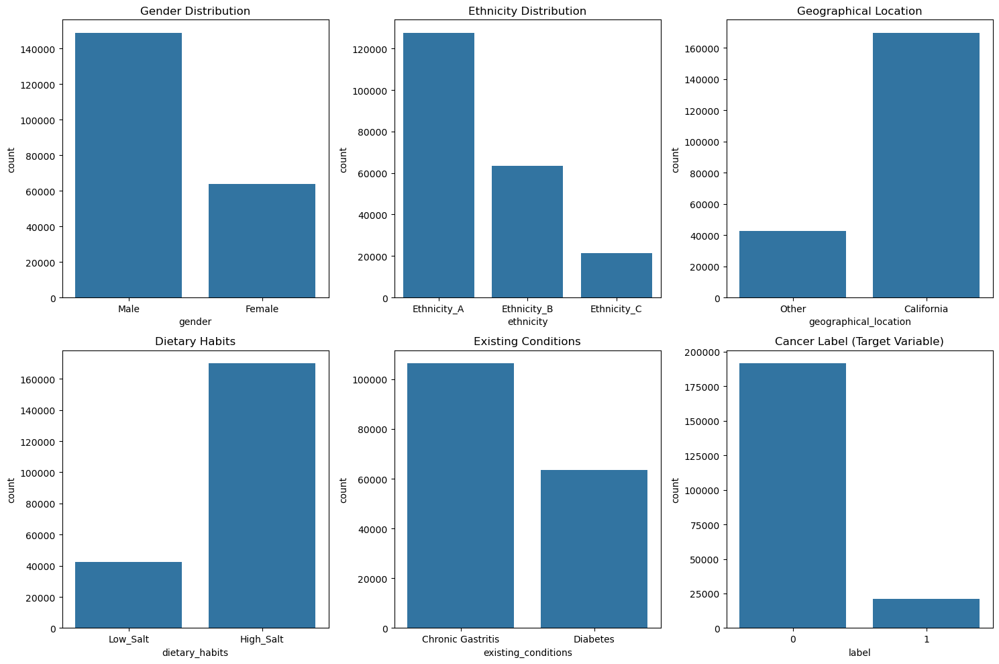

In [13]:
plt.figure(figsize=(15, 10))

# First plot: Gender
plt.subplot(2, 3, 1)
sns.countplot(x='gender', data=gc_data)
plt.title("Gender Distribution")

# Second plot: Ethnicity
plt.subplot(2, 3, 2)
sns.countplot(x='ethnicity', data=gc_data)
plt.title("Ethnicity Distribution")

# Third plot: Geographical Location
plt.subplot(2, 3, 3)
sns.countplot(x='geographical_location', data=gc_data)
plt.title("Geographical Location")

# Fourth plot: Dietary Habits
plt.subplot(2, 3, 4)
sns.countplot(x='dietary_habits', data=gc_data)
plt.title("Dietary Habits")

# Fifth plot: Existing Conditions (excluding NaN)
plt.subplot(2, 3, 5)
sns.countplot(x='existing_conditions', data=gc_data[gc_data['existing_conditions'].notna()])
plt.title("Existing Conditions")

# Sixth plot: Label
plt.subplot(2, 3, 6)
sns.countplot(x='label', data=gc_data)
plt.title("Cancer Label (Target Variable)")

plt.tight_layout()
plt.show()

In [14]:
def plot_categorical_distribution(col):
    fig = px.histogram(gc_data, x=col, title=f"Distribution of {col}", text_auto=True)
    fig.update_layout(bargap=0.2)
    fig.show()

interact(plot_categorical_distribution, col=widgets.Dropdown(options=gc_data.columns, description='Column:'))


interactive(children=(Dropdown(description='Column:', options=('age', 'gender', 'ethnicity', 'geographical_loc…

<function __main__.plot_categorical_distribution(col)>

**Handeling missing values**
Existing Conditions:
Chronic Gastritis and Diabetes are present
⚠️ 42,486 missing values (needs special handling)
Lets see why

In [15]:
gc_data_missing = gc_data[gc_data['existing_conditions'].isna()]

In [16]:
gc_data_missing.shape

(42486, 24)

In [17]:
def plot_missing_dist(col):
    fig = px.histogram(gc_data_missing, x=col, title=f"Distribution of {col}", text_auto=True)
    fig.update_layout(bargap=0.2)
    fig.show()

interact(plot_missing_dist, col=widgets.Dropdown(options=gc_data_missing.columns, description='Column:'))


interactive(children=(Dropdown(description='Column:', options=('age', 'gender', 'ethnicity', 'geographical_loc…

<function __main__.plot_missing_dist(col)>

In [18]:
has_diabetes = gc_data[gc_data['existing_conditions'] == 'Diabetes']
has_gastritis = gc_data[gc_data['existing_conditions'] == 'Chronic Gastritis']

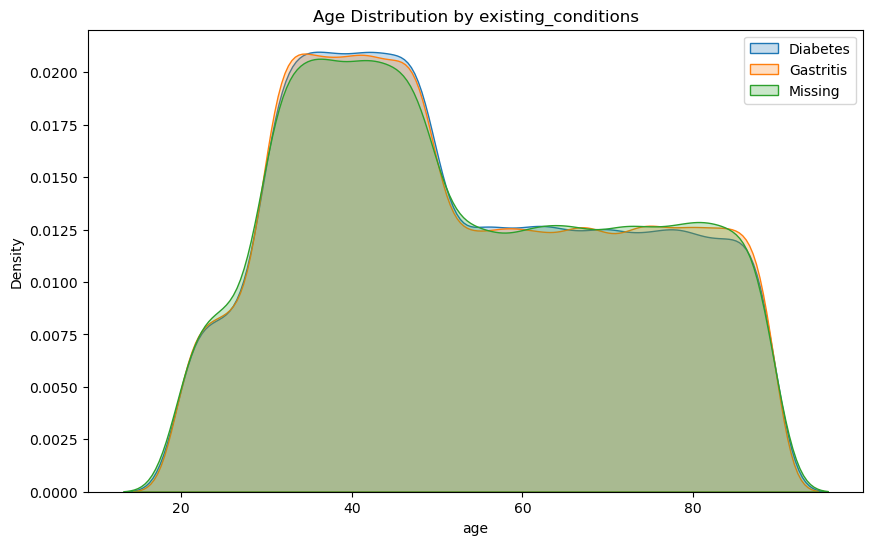

In [19]:
plt.figure(figsize=(10,6))
sns.kdeplot(has_diabetes['age'], label='Diabetes', fill=True)
sns.kdeplot(has_gastritis['age'], label='Gastritis', fill=True)
sns.kdeplot(gc_data_missing['age'], label='Missing', fill=True)
plt.title("Age Distribution by existing_conditions")
plt.legend()
plt.show()

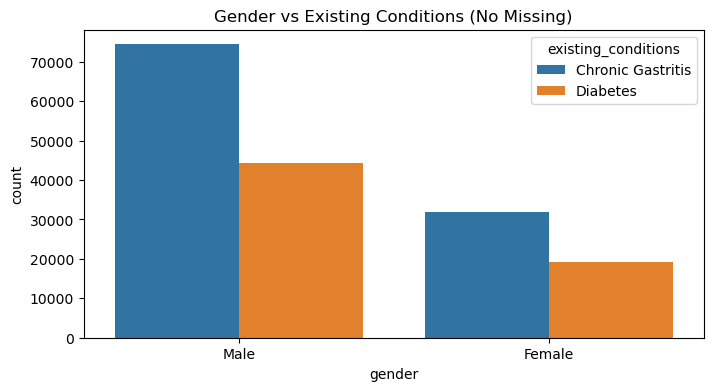

In [20]:
plt.figure(figsize=(8, 4))
sns.countplot(data=gc_data[gc_data['existing_conditions'].notna()], x='gender', hue='existing_conditions')
plt.title("Gender vs Existing Conditions (No Missing)")
plt.show()

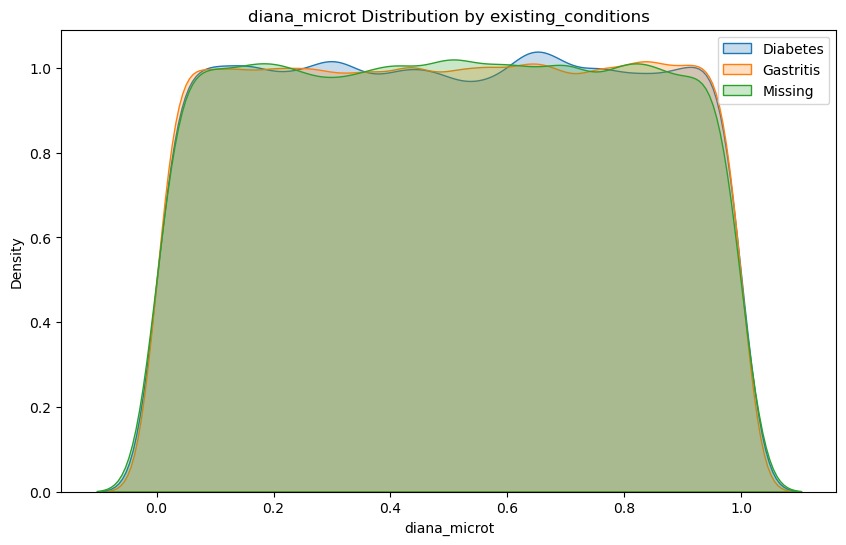

In [21]:
plt.figure(figsize=(10,6))
sns.kdeplot(has_diabetes['diana_microt'], label='Diabetes', fill=True)
sns.kdeplot(has_gastritis['diana_microt'], label='Gastritis', fill=True)
sns.kdeplot(gc_data_missing['diana_microt'], label='Missing', fill=True)
plt.title("diana_microt Distribution by existing_conditions")
plt.legend()
plt.show()

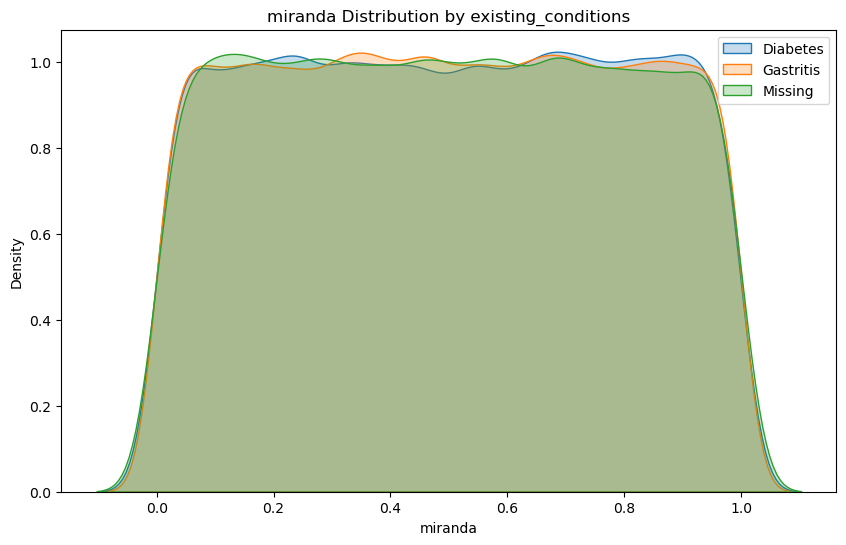

In [22]:
plt.figure(figsize=(10,6))
sns.kdeplot(has_diabetes['miranda'], label='Diabetes', fill=True)
sns.kdeplot(has_gastritis['miranda'], label='Gastritis', fill=True)
sns.kdeplot(gc_data_missing['miranda'], label='Missing', fill=True)
plt.title("miranda Distribution by existing_conditions")
plt.legend()
plt.show()

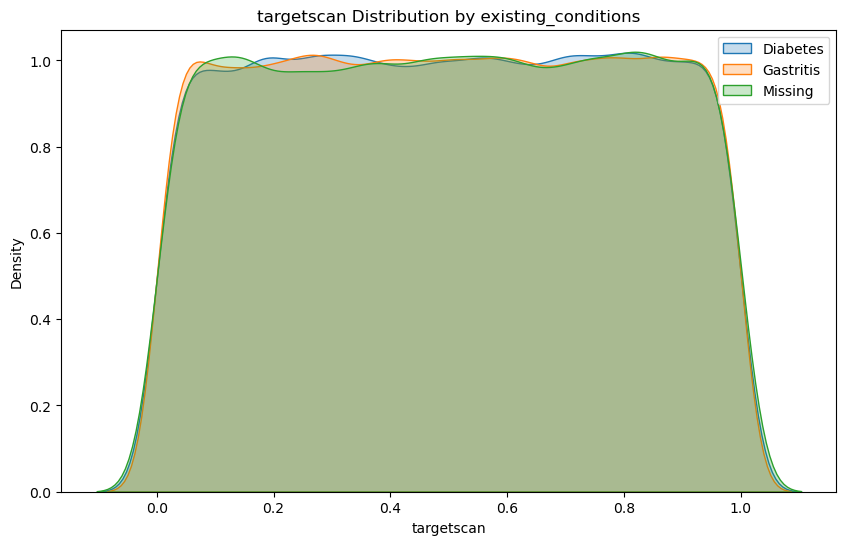

In [23]:
plt.figure(figsize=(10,6))
sns.kdeplot(has_diabetes['targetscan'], label='Diabetes', fill=True)
sns.kdeplot(has_gastritis['targetscan'], label='Gastritis', fill=True)
sns.kdeplot(gc_data_missing['targetscan'], label='Missing', fill=True)
plt.title("targetscan Distribution by existing_conditions")
plt.legend()
plt.show()

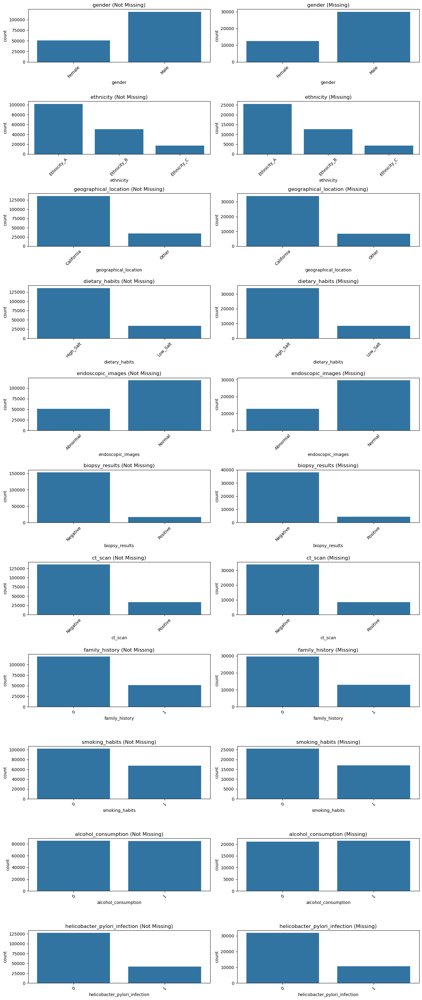

In [24]:
# Split the dataset
missing_condition = gc_data[gc_data['existing_conditions'].isnull()]
not_missing_condition = gc_data[gc_data['existing_conditions'].notnull()]

# Choose columns to compare
cols_to_plot = ['gender', 'ethnicity', 'geographical_location', 'dietary_habits',
                'endoscopic_images', 'biopsy_results', 'ct_scan', 'family_history',
                'smoking_habits', 'alcohol_consumption', 'helicobacter_pylori_infection']

# Set up subplots
n_cols = 2
n_rows = len(cols_to_plot)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 3))

for i, col in enumerate(cols_to_plot):
    sns.countplot(x=col, data=not_missing_condition, ax=axes[i, 0], order=sorted(gc_data[col].dropna().unique()))
    axes[i, 0].set_title(f'{col} (Not Missing)')
    axes[i, 0].tick_params(axis='x', rotation=45)

    sns.countplot(x=col, data=missing_condition, ax=axes[i, 1], order=sorted(gc_data[col].dropna().unique()))
    axes[i, 1].set_title(f'{col} (Missing)')
    axes[i, 1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

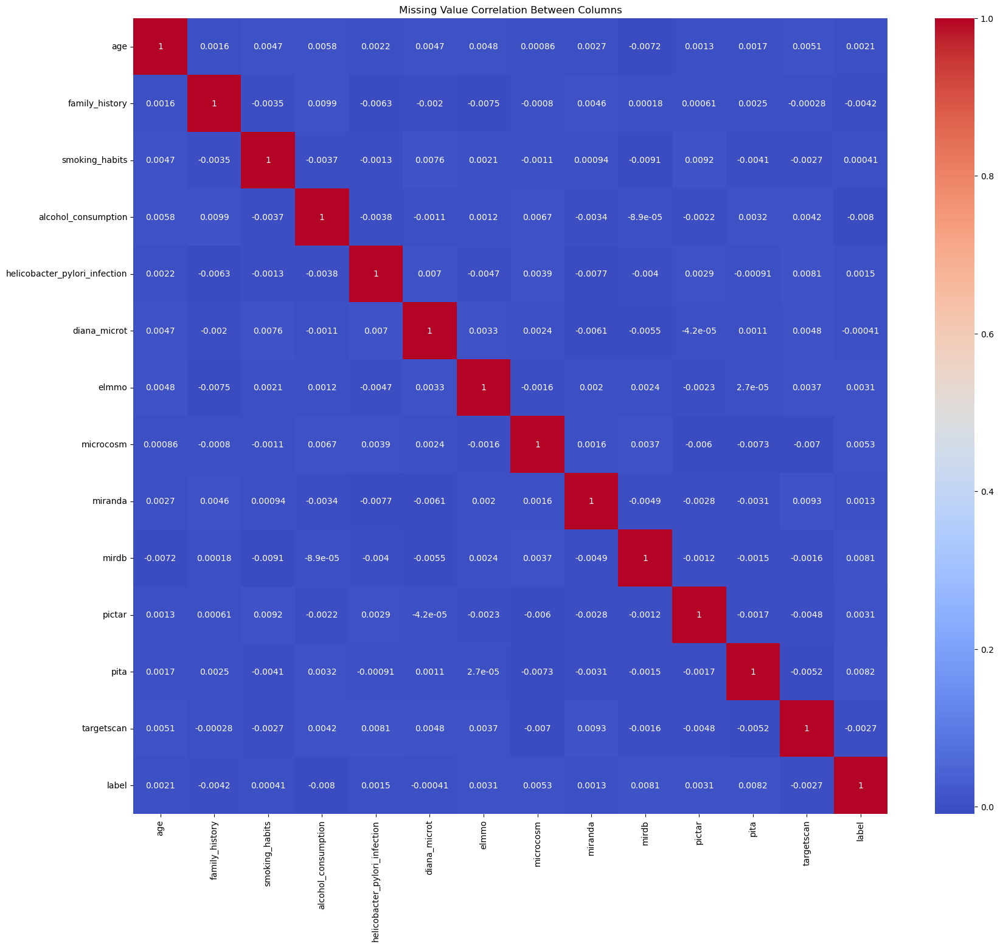

In [25]:
gc_data_missing_num = gc_data_missing[numerical_columns]
plt.figure(figsize=(20, 17))
sns.heatmap(gc_data_missing_num.corr(), cmap='coolwarm', annot=True)
plt.title('Missing Value Correlation Between Columns')
plt.show()

## Missing Values Analysis: `existing_condition` Column

### Key Findings

### Interpretation

#### Missing Values Likely Indicate "No Condition"
🔍 **Rationale:**
1. No systematic pattern found in missingness
2. Clinical context suggests blank = no reported conditions
3. Common in self-reported health data

## Recommended Actions

```python
# Best practice handling:
df['existing_condition'] = 
    df['existing_condition']
    .fillna('No_condition')  # Explicit category


In [26]:
gc_data['existing_conditions'] = gc_data['existing_conditions'].fillna("No_condition")
gc_data.head()

,age,gender,ethnicity,geographical_location,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,dietary_habits,existing_conditions,endoscopic_images,biopsy_results,ct_scan,mature_mirna_acc,target_symbol,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan,label
0,43,Male,Ethnicity_A,Other,1,0,0,0,Low_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,TP53,0.3813,0.1870,0.7864,0.2048,0.5619,0.4382,0.2836,0.9282,0
1,86,Female,Ethnicity_B,California,1,0,0,1,High_Salt,Diabetes,Normal,Negative,Negative,MIR123,TP53,0.9586,0.4933,0.9640,0.4980,0.9856,0.1446,0.3754,0.1036,0
2,68,Male,Ethnicity_A,California,0,1,1,0,High_Salt,No_condition,Normal,Negative,Negative,MIR345,KRAS,0.2695,0.5736,0.6669,0.5404,0.9059,0.8273,0.3509,0.1669,0
3,57,Female,Ethnicity_A,Other,0,0,0,1,High_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,KRAS,0.3723,0.2614,0.9495,0.1342,0.4299,0.9352,0.7947,0.8670,0
4,33,Male,Ethnicity_A,California,0,1,1,0,High_Salt,Diabetes,Abnormal,Negative,Negative,MIR345,CDH1,0.9747,0.7545,0.2632,0.8768,0.6508,0.3377,0.4275,0.9158,0


In [27]:
gc_data.describe()

,age,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan,label
count,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,212354.0000
mean,53.2580,0.3006,0.3992,0.4994,0.2495,5.0053e-01,4.9950e-01,5.0008e-01,4.9989e-01,5.0013e-01,4.9897e-01,5.0115e-01,5.0112e-01,0.0987
std,18.9844,0.4585,0.4897,0.5000,0.4327,2.8876e-01,2.8885e-01,2.8849e-01,2.8857e-01,2.8874e-01,2.8850e-01,2.8887e-01,2.8868e-01,0.2983
min,20.0000,0.0000,0.0000,0.0000,0.0000,5.4594e-06,6.0891e-07,2.8074e-06,1.1602e-06,1.2888e-05,7.7440e-07,7.9775e-06,4.1365e-06,0.0000
25%,37.0000,0.0000,0.0000,0.0000,0.0000,2.5003e-01,2.4865e-01,2.4988e-01,2.5021e-01,2.5029e-01,2.4979e-01,2.5032e-01,2.5179e-01,0.0000
50%,50.0000,0.0000,0.0000,0.0000,0.0000,5.0130e-01,4.9980e-01,5.0050e-01,4.9963e-01,4.9989e-01,4.9852e-01,5.0223e-01,5.0181e-01,0.0000
75%,69.0000,1.0000,1.0000,1.0000,0.0000,7.5078e-01,7.4958e-01,7.4877e-01,7.4907e-01,7.4999e-01,7.4872e-01,7.5121e-01,7.5186e-01,0.0000
max,89.0000,1.0000,1.0000,1.0000,1.0000,1.0000e+00,1.0000e+00,1.0000e+00,1.0000e+00,1.0000e+00,1.0000e+00,9.9999e-01,1.0000e+00,1.0000


In [28]:
gc_data_cat = gc_data[categorical_columns]
gc_data_cat.head()

,gender,ethnicity,geographical_location,dietary_habits,existing_conditions,endoscopic_images,biopsy_results,ct_scan,mature_mirna_acc,target_symbol
0,Male,Ethnicity_A,Other,Low_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,TP53
1,Female,Ethnicity_B,California,High_Salt,Diabetes,Normal,Negative,Negative,MIR123,TP53
2,Male,Ethnicity_A,California,High_Salt,No_condition,Normal,Negative,Negative,MIR345,KRAS
3,Female,Ethnicity_A,Other,High_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,KRAS
4,Male,Ethnicity_A,California,High_Salt,Diabetes,Abnormal,Negative,Negative,MIR345,CDH1


In [29]:
gc_data_cat['existing_conditions'].value_counts()

existing_conditions
Chronic Gastritis    106309
Diabetes              63559
No_condition          42486
Name: count, dtype: int64

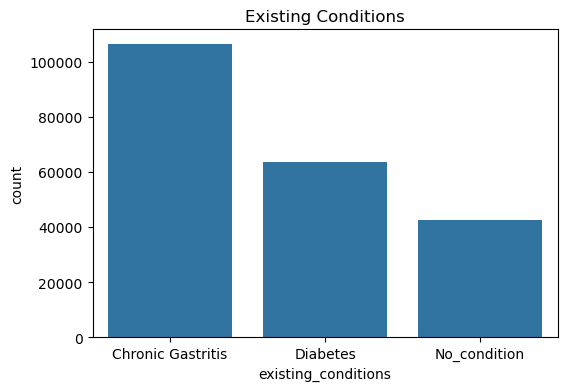

In [30]:
plt.figure(figsize=(6, 4))
sns.countplot(data=gc_data, x=gc_data['existing_conditions'])
plt.title("Existing Conditions")
plt.show()

# 🧬 Step 3: Balancing the Dataset

To address the severe class imbalance (`label 0`: ~191k vs `label 1`: ~21k), we use **multi techniques** to balance the data (Please check the balancing folder in preprocessing).

## Encoding the data first

In [31]:
gc_data_cat.head()

,gender,ethnicity,geographical_location,dietary_habits,existing_conditions,endoscopic_images,biopsy_results,ct_scan,mature_mirna_acc,target_symbol
0,Male,Ethnicity_A,Other,Low_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,TP53
1,Female,Ethnicity_B,California,High_Salt,Diabetes,Normal,Negative,Negative,MIR123,TP53
2,Male,Ethnicity_A,California,High_Salt,No_condition,Normal,Negative,Negative,MIR345,KRAS
3,Female,Ethnicity_A,Other,High_Salt,Chronic Gastritis,Normal,Negative,Negative,MIR123,KRAS
4,Male,Ethnicity_A,California,High_Salt,Diabetes,Abnormal,Negative,Negative,MIR345,CDH1


In [32]:
# Columns to label encode
cols_to_label_encode = ['gender', 'geographical_location', 'dietary_habits', 
                        'endoscopic_images', 'biopsy_results', 'ct_scan']

In [33]:
label_enc = LabelEncoder()

# Encode each column individually
for col in cols_to_label_encode:
    gc_data_bin[col] = label_enc.fit_transform(gc_data_cat[col])

# Drop original columns from the original DataFrame
gc_data_cat.drop(columns=cols_to_label_encode, inplace=True)
gc_data_bin.head()

/tmp/ipykernel_13717/1542117261.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_13717/1542117261.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_13717/1542117261.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1

,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,label,gender,geographical_location,dietary_habits,endoscopic_images,biopsy_results,ct_scan
0,1,0,0,0,0,1,1,1,1,0,0
1,1,0,0,1,0,0,0,0,1,0,0
2,0,1,1,0,0,1,0,0,1,0,0
3,0,0,0,1,0,0,1,0,1,0,0
4,0,1,1,0,0,1,0,0,0,0,0


In [34]:
gc_data_cat.head()

,ethnicity,existing_conditions,mature_mirna_acc,target_symbol
0,Ethnicity_A,Chronic Gastritis,MIR123,TP53
1,Ethnicity_B,Diabetes,MIR123,TP53
2,Ethnicity_A,No_condition,MIR345,KRAS
3,Ethnicity_A,Chronic Gastritis,MIR123,KRAS
4,Ethnicity_A,Diabetes,MIR345,CDH1


In [35]:
gc_data_num.drop(columns = ['family_history', 'smoking_habits', 'alcohol_consumption', 'helicobacter_pylori_infection'] , inplace = True)
gc_data_num.head()

/tmp/ipykernel_13717/1102331909.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,age,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan,label
0,43,0.3813,0.1870,0.7864,0.2048,0.5619,0.4382,0.2836,0.9282,0
1,86,0.9586,0.4933,0.9640,0.4980,0.9856,0.1446,0.3754,0.1036,0
2,68,0.2695,0.5736,0.6669,0.5404,0.9059,0.8273,0.3509,0.1669,0
3,57,0.3723,0.2614,0.9495,0.1342,0.4299,0.9352,0.7947,0.8670,0
4,33,0.9747,0.7545,0.2632,0.8768,0.6508,0.3377,0.4275,0.9158,0


In [36]:
gc_data_num.describe()

,age,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan,label
count,212354.0000,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,212354.0000
mean,53.2580,5.0053e-01,4.9950e-01,5.0008e-01,4.9989e-01,5.0013e-01,4.9897e-01,5.0115e-01,5.0112e-01,0.0987
std,18.9844,2.8876e-01,2.8885e-01,2.8849e-01,2.8857e-01,2.8874e-01,2.8850e-01,2.8887e-01,2.8868e-01,0.2983
min,20.0000,5.4594e-06,6.0891e-07,2.8074e-06,1.1602e-06,1.2888e-05,7.7440e-07,7.9775e-06,4.1365e-06,0.0000
25%,37.0000,2.5003e-01,2.4865e-01,2.4988e-01,2.5021e-01,2.5029e-01,2.4979e-01,2.5032e-01,2.5179e-01,0.0000
50%,50.0000,5.0130e-01,4.9980e-01,5.0050e-01,4.9963e-01,4.9989e-01,4.9852e-01,5.0223e-01,5.0181e-01,0.0000
75%,69.0000,7.5078e-01,7.4958e-01,7.4877e-01,7.4907e-01,7.4999e-01,7.4872e-01,7.5121e-01,7.5186e-01,0.0000
max,89.0000,1.0000e+00,1.0000e+00,1.0000e+00,1.0000e+00,1.0000e+00,1.0000e+00,9.9999e-01,1.0000e+00,1.0000


In [37]:
label_column_only = gc_data['label']
gc_data_bin.drop('label', axis = 1, inplace = True)

/tmp/ipykernel_13717/4131007151.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Now we have
> gc_data_cat, holds categoral data

> gc_data_bin, holds binary data

> gc_data_num, holds numerical data

In [38]:
# Code to just organize them and see their names next to each other
for col in gc_data_cat.columns:
    print(col,' - ',sep = '' ,end = '')
print(end = '\n\n')
for col in gc_data_bin.columns:
    print(col,' - ',sep = '' ,end = '')
print(end = '\n\n')
for col in gc_data_num.columns:
    print(col,' - ',sep = '' ,end = '')

ethnicity - existing_conditions - mature_mirna_acc - target_symbol - 

family_history - smoking_habits - alcohol_consumption - helicobacter_pylori_infection - gender - geographical_location - dietary_habits - endoscopic_images - biopsy_results - ct_scan - 

age - diana_microt - elmmo - microcosm - miranda - mirdb - pictar - pita - targetscan - label - 

**Now lets encode the categoral data with one hot encoding**

In [39]:
ohe = OneHotEncoder(sparse_output = False, drop = None)

gc_data_cat_encoded = ohe.fit_transform(gc_data_cat)
gc_data_cat_encoded = pd.DataFrame(gc_data_cat_encoded, columns = ohe.get_feature_names_out(gc_data_cat.columns), index = gc_data_cat.index)
gc_data_cat_encoded.head()

,ethnicity_Ethnicity_A,ethnicity_Ethnicity_B,ethnicity_Ethnicity_C,existing_conditions_Chronic Gastritis,existing_conditions_Diabetes,existing_conditions_No_condition,mature_mirna_acc_MIR123,mature_mirna_acc_MIR234,mature_mirna_acc_MIR345,target_symbol_CDH1,target_symbol_KRAS,target_symbol_TP53
0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
3,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0


In [40]:
gc_data_encoded = pd.concat([gc_data_cat_encoded, gc_data_bin, gc_data_num], axis=1)
gc_data_encoded.head()

,ethnicity_Ethnicity_A,ethnicity_Ethnicity_B,ethnicity_Ethnicity_C,existing_conditions_Chronic Gastritis,existing_conditions_Diabetes,existing_conditions_No_condition,mature_mirna_acc_MIR123,mature_mirna_acc_MIR234,mature_mirna_acc_MIR345,target_symbol_CDH1,target_symbol_KRAS,target_symbol_TP53,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,gender,geographical_location,dietary_habits,endoscopic_images,biopsy_results,ct_scan,age,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan,label
0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0,1,1,1,1,0,0,43,0.3813,0.1870,0.7864,0.2048,0.5619,0.4382,0.2836,0.9282,0
1,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,0,0,1,0,0,0,1,0,0,86,0.9586,0.4933,0.9640,0.4980,0.9856,0.1446,0.3754,0.1036,0
2,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,1,0,1,0,0,1,0,0,68,0.2695,0.5736,0.6669,0.5404,0.9059,0.8273,0.3509,0.1669,0
3,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,0,1,0,1,0,1,0,0,57,0.3723,0.2614,0.9495,0.1342,0.4299,0.9352,0.7947,0.8670,0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0,1,1,0,1,0,0,0,0,0,33,0.9747,0.7545,0.2632,0.8768,0.6508,0.3377,0.4275,0.9158,0


In [41]:
print(gc_data_encoded.columns)
print(gc_data_encoded.shape)

Index(['ethnicity_Ethnicity_A', 'ethnicity_Ethnicity_B',
       'ethnicity_Ethnicity_C', 'existing_conditions_Chronic Gastritis',
       'existing_conditions_Diabetes', 'existing_conditions_No_condition',
       'mature_mirna_acc_MIR123', 'mature_mirna_acc_MIR234',
       'mature_mirna_acc_MIR345', 'target_symbol_CDH1', 'target_symbol_KRAS',
       'target_symbol_TP53', 'family_history', 'smoking_habits',
       'alcohol_consumption', 'helicobacter_pylori_infection', 'gender',
       'geographical_location', 'dietary_habits', 'endoscopic_images',
       'biopsy_results', 'ct_scan', 'age', 'diana_microt', 'elmmo',
       'microcosm', 'miranda', 'mirdb', 'pictar', 'pita', 'targetscan',
       'label'],
      dtype='object')
(212354, 32)


In [42]:
gc_data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 212354 entries, 0 to 212353
Data columns (total 32 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   ethnicity_Ethnicity_A                  212354 non-null  float64
 1   ethnicity_Ethnicity_B                  212354 non-null  float64
 2   ethnicity_Ethnicity_C                  212354 non-null  float64
 3   existing_conditions_Chronic Gastritis  212354 non-null  float64
 4   existing_conditions_Diabetes           212354 non-null  float64
 5   existing_conditions_No_condition       212354 non-null  float64
 6   mature_mirna_acc_MIR123                212354 non-null  float64
 7   mature_mirna_acc_MIR234                212354 non-null  float64
 8   mature_mirna_acc_MIR345                212354 non-null  float64
 9   target_symbol_CDH1                     212354 non-null  float64
 10  target_symbol_KRAS                     212354 non-null  

In [43]:
gc_data_encoded.describe()

,ethnicity_Ethnicity_A,ethnicity_Ethnicity_B,ethnicity_Ethnicity_C,existing_conditions_Chronic Gastritis,existing_conditions_Diabetes,existing_conditions_No_condition,mature_mirna_acc_MIR123,mature_mirna_acc_MIR234,mature_mirna_acc_MIR345,target_symbol_CDH1,target_symbol_KRAS,target_symbol_TP53,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,gender,geographical_location,dietary_habits,endoscopic_images,biopsy_results,ct_scan,age,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan,label
count,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,212354.0000,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,2.1235e+05,212354.0000
mean,0.6007,0.2994,0.0999,0.5006,0.2993,0.2001,0.6998,0.2,0.1002,0.2994,0.1998,0.5008,0.3006,0.3992,0.4994,0.2495,0.7003,0.2013,0.2004,0.6994,0.0995,0.2007,53.2580,5.0053e-01,4.9950e-01,5.0008e-01,4.9989e-01,5.0013e-01,4.9897e-01,5.0115e-01,5.0112e-01,0.0987
std,0.4897,0.4580,0.2999,0.5000,0.4580,0.4001,0.4584,0.4,0.3003,0.4580,0.3999,0.5000,0.4585,0.4897,0.5000,0.4327,0.4581,0.4010,0.4003,0.4585,0.2993,0.4005,18.9844,2.8876e-01,2.8885e-01,2.8849e-01,2.8857e-01,2.8874e-01,2.8850e-01,2.8887e-01,2.8868e-01,0.2983
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,20.0000,5.4594e-06,6.0891e-07,2.8074e-06,1.1602e-06,1.2888e-05,7.7440e-07,7.9775e-06,4.1365e-06,0.0000
25%,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,37.0000,2.5003e-01,2.4865e-01,2.4988e-01,2.5021e-01,2.5029e-01,2.4979e-01,2.5032e-01,2.5179e-01,0.0000
50%,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,50.0000,5.0130e-01,4.9980e-01,5.0050e-01,4.9963e-01,4.9989e-01,4.9852e-01,5.0223e-01,5.0181e-01,0.0000
75%,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,1.0000,0.0,0.0000,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,69.0000,7.5078e-01,7.4958e-01,7.4877e-01,7.4907e-01,7.4999e-01,7.4872e-01,7.5121e-01,7.5186e-01,0.0000
max,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,89.0000,1.0000e+00,1.0000e+00,1.0000e+00,1.0000e+00,1.0000e+00,1.0000e+00,9.9999e-01,1.0000e+00,1.0000


In [44]:
#gc_data_encoded.to_csv('gc_data_encoded')

## Splitting the data
We will split the data to 15% validation set, 15% testing set, 70% training set before balancing

In [45]:
Y = gc_data_encoded['label']
X = gc_data_encoded.drop('label',axis = 1)

# Splitting the data to 30% test and 70% train for now
x_train, x_temp, y_train, y_temp = train_test_split(X,Y, test_size = 0.3, random_state = 42, stratify = Y)


# Split that 30% into 15% validation and 15% test (i.e., 50% of 30%)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

### put the test set aside and never touch it !!!!!!!!!!!!!!!!!!!!!

In [46]:
# x_test.to_csv('x_test', index = False)
# y_test.to_csv('y_test', index = False)

# x_val.to_csv('../datasets/Validation_set/x_val', index = False)
# y_val.to_csv('../datasets/Validation_set/y_val', index = False)

# x_train.to_csv('../datasets/Training_set/x_train', index = False)
# y_train.to_csv('../datasets/Training_set/y_train', index = False)

### Now we should scale

In [47]:
# scaler = StandardScaler()

# # ============= Features to scale =================
# features_to_scale = x_train.columns

# # ----------------- Train -----------------
# x_train_scaled = scaler.fit_transform(x_train[features_to_scale])
# x_train_scaled = pd.DataFrame(x_train_scaled, columns=features_to_scale, index=x_train.index)
# x_train_other = x_train.drop(columns=features_to_scale)
# x_train_scaled = pd.concat([x_train_other, x_train_scaled], axis=1)

# # ----------------- Validation -----------------
# x_val_scaled = scaler.transform(x_val[features_to_scale])
# x_val_scaled = pd.DataFrame(x_val_scaled, columns=features_to_scale, index=x_val.index)
# x_val_other = x_val.drop(columns=features_to_scale)
# x_val_scaled = pd.concat([x_val_other, x_val_scaled], axis=1)

# # ----------------- Test -----------------
# x_test_scaled = scaler.transform(x_test[features_to_scale])
# x_test_scaled = pd.DataFrame(x_test_scaled, columns=features_to_scale, index=x_test.index)
# x_test_other = x_test.drop(columns=features_to_scale)
# x_test_scaled = pd.concat([x_test_other, x_test_scaled], axis=1)

In [48]:
# x_test_scaled.to_csv('../datasets/Test_set/x_test_scaled', index = False)

# x_val_scaled.to_csv('../datasets/Validation_set/x_val_scaled', index = False)

# x_train_scaled.to_csv('../datasets/Training_set/x_train_scaled', index = False)

In [49]:
# gc_data -------> gc_data_encoded -----> x ------> x_train -----> x_train_scaled
#                                  |         |----> x_val   -----> x_val_scaled
#                                  |         |----> x_test  -----> x_test_scaled
#                                  |
#                                  |-----> y ------> y_train
#                                   (label)  |----> y_val
#                                            |----> y_test
#

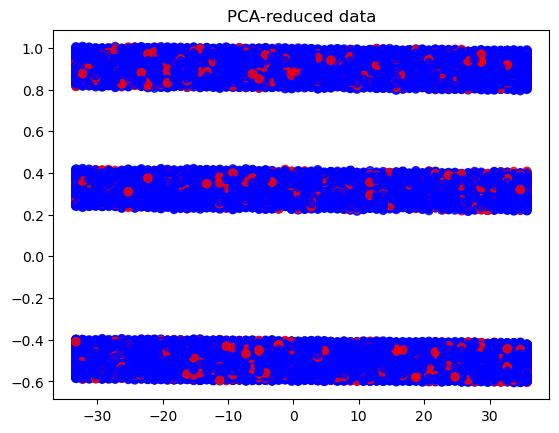

In [50]:
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(x_train)

plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y_train, cmap='bwr', alpha = 0.8)
plt.title("PCA-reduced data")
plt.show()

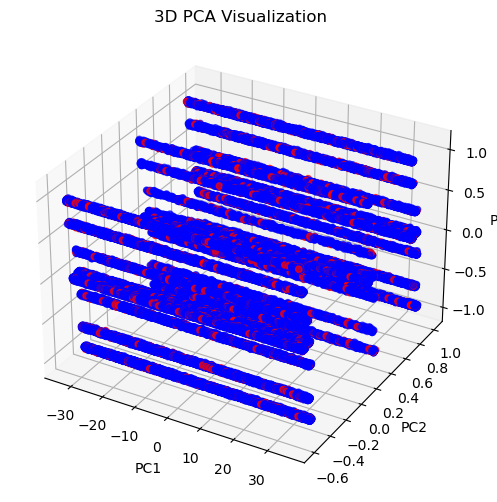

In [51]:
pca = PCA(n_components=3)
X_3d = pca.fit_transform(x_train)

# 3D Plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(X_3d[:, 0], X_3d[:, 1], X_3d[:, 2], c=y_train, cmap='bwr', alpha=0.7)
ax.set_title("3D PCA Visualization")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.show()

[[25205  3504]
 [ 2778   366]]
Decesion Tree
Accuracy:  0.8027815276426082
Percission:  0.09457364341085271
Recall:  0.11641221374045801
F1:  0.10436270316509838


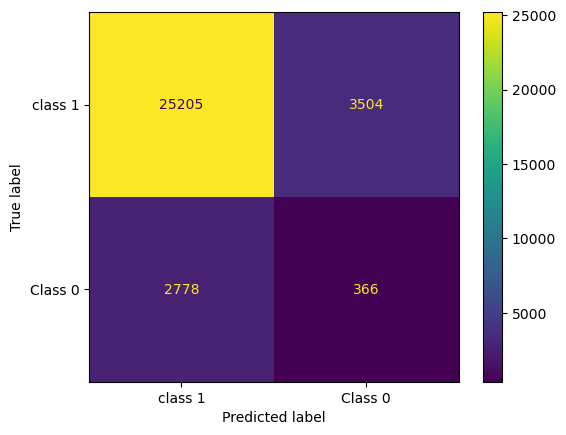

In [53]:
DT = DecisionTreeClassifier()
DT.fit(x_train,y_train)
y_pred = DT.predict(x_val)


accuracy = accuracy_score(y_val, y_pred)
Percission = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)


cm = confusion_matrix(y_val, y_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["class 1", "Class 0"])
disp.plot()


print("Decesion Tree")
print("Accuracy: ", accuracy)
print("Percission: ", Percission)
print("Recall: ", recall)
print("F1: ", f1)

[[28709     0]
 [ 3144     0]]
Random Forest
Accuracy:  0.9012965811697485
Percission:  0.0
Recall:  0.0
F1:  0.0


/usr/lib/python3/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



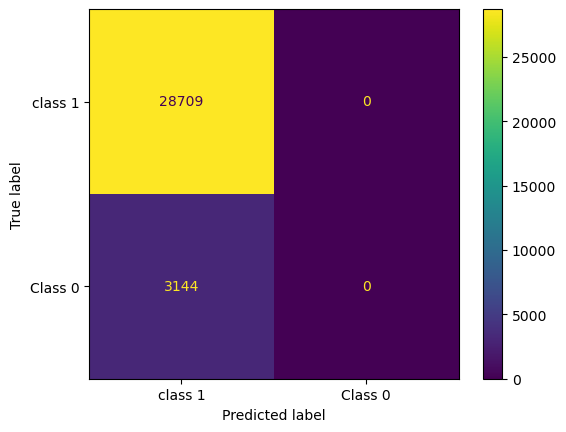

In [54]:
RF = RandomForestClassifier()
RF.fit(x_train,y_train)
y_pred = RF.predict(x_val)


accuracy = accuracy_score(y_val, y_pred)
Percission = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)


cm = confusion_matrix(y_val, y_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["class 1", "Class 0"])
disp.plot()


print("Random Forest")
print("Accuracy: ", accuracy)
print("Percission: ", Percission)
print("Recall: ", recall)
print("F1: ", f1)

## Balancing

In [55]:
smote = SMOTE(random_state = 42)

x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)

In [56]:
y_train_resampled.value_counts()

label
0    133976
1    133976
Name: count, dtype: int64

In [57]:
x_train_resampled

,ethnicity_Ethnicity_A,ethnicity_Ethnicity_B,ethnicity_Ethnicity_C,existing_conditions_Chronic Gastritis,existing_conditions_Diabetes,existing_conditions_No_condition,mature_mirna_acc_MIR123,mature_mirna_acc_MIR234,mature_mirna_acc_MIR345,target_symbol_CDH1,target_symbol_KRAS,target_symbol_TP53,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,gender,geographical_location,dietary_habits,endoscopic_images,biopsy_results,ct_scan,age,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan
0,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0,0.0,0.0,1.0,0,0,1,0,1,0,0,1,0,0,41,0.0070,0.7394,0.1974,0.3029,0.6381,0.5652,0.8416,0.8237
1,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0,1.0,0.0,0.0,1,0,0,0,1,0,0,1,0,0,43,0.3785,0.2194,0.6914,0.5708,0.1280,0.9046,0.6877,0.3209
2,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,82,0.9717,0.2317,0.0368,0.5427,0.1731,0.3155,0.4949,0.2257
3,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0,1.0,0.0,0.0,0,0,1,0,1,1,0,0,0,0,61,0.7189,0.3742,0.8873,0.8636,0.3538,0.0270,0.1657,0.3433
4,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0,0.0,1.0,0.0,0,0,0,0,1,0,0,0,0,0,73,0.2018,0.1738,0.9973,0.9016,0.7641,0.8203,0.5364,0.3457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267947,0.0000,0.1854,0.8146,0.0000,1.0000,0.0000,1.0000,0.0000,0.0,0.0,0.0,1.0,0,0,1,0,1,0,0,0,0,0,37,0.6329,0.2030,0.9034,0.8308,0.7255,0.9457,0.9028,0.4396
267948,0.7697,0.2303,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0,0.0,0.0,1.0,1,1,1,0,1,1,0,1,0,0,72,0.3120,0.2428,0.7102,0.3418,0.6977,0.3666,0.3340,0.6099
267949,1.0000,0.0000,0.0000,0.0000,0.7508,0.2492,1.0000,0.0000,0.0,1.0,0.0,0.0,0,0,1,0,0,1,0,1,0,1,60,0.7141,0.6141,0.2423,0.1597,0.7901,0.1727,0.1837,0.5683
267950,0.0000,1.0000,0.0000,0.3132,0.6868,0.0000,0.3132,0.6868,0.0,1.0,0.0,0.0,1,0,0,1,1,1,1,1,0,0,55,0.5327,0.1102,0.1308,0.5514,0.5341,0.5153,0.3946,0.8704


In [59]:
# x_val_scaled

In [60]:
x_train_resampled.describe()

,ethnicity_Ethnicity_A,ethnicity_Ethnicity_B,ethnicity_Ethnicity_C,existing_conditions_Chronic Gastritis,existing_conditions_Diabetes,existing_conditions_No_condition,mature_mirna_acc_MIR123,mature_mirna_acc_MIR234,mature_mirna_acc_MIR345,target_symbol_CDH1,target_symbol_KRAS,target_symbol_TP53,family_history,smoking_habits,alcohol_consumption,helicobacter_pylori_infection,gender,geographical_location,dietary_habits,endoscopic_images,biopsy_results,ct_scan,age,diana_microt,elmmo,microcosm,miranda,mirdb,pictar,pita,targetscan
count,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.0000,267952.000,267952.0000,2.6795e+05,2.6795e+05,2.6795e+05,2.6795e+05,2.6795e+05,2.6795e+05,2.6795e+05,2.6795e+05
mean,0.6113,0.2959,0.0928,0.5070,0.2974,0.1956,0.7149,0.1930,0.0921,0.2986,0.1953,0.5061,0.2478,0.3477,0.4535,0.1967,0.6712,0.1558,0.1536,0.6680,0.0665,0.153,53.1212,5.0219e-01,4.9929e-01,5.0057e-01,4.9893e-01,5.0016e-01,4.9923e-01,5.0132e-01,5.0050e-01
std,0.4815,0.4513,0.2833,0.4950,0.4521,0.3913,0.4442,0.3886,0.2819,0.4525,0.3909,0.4947,0.4318,0.4762,0.4978,0.3975,0.4698,0.3627,0.3606,0.4709,0.2491,0.360,19.0291,2.7007e-01,2.6896e-01,2.6946e-01,2.6883e-01,2.6946e-01,2.6974e-01,2.6954e-01,2.6919e-01
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,20.0000,5.4594e-06,6.0891e-07,2.8074e-06,1.1602e-06,1.7355e-05,2.5375e-06,7.9775e-06,4.1365e-06
25%,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,37.0000,2.7716e-01,2.7657e-01,2.7621e-01,2.7607e-01,2.7657e-01,2.7581e-01,2.7727e-01,2.7771e-01
50%,1.0000,0.0000,0.0000,0.7395,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.6917,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.000,49.0000,5.0380e-01,4.9945e-01,5.0208e-01,4.9832e-01,4.9930e-01,4.9734e-01,5.0235e-01,5.0156e-01
75%,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,1.0000,1.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.000,69.0000,7.2708e-01,7.2155e-01,7.2422e-01,7.2103e-01,7.2394e-01,7.2428e-01,7.2576e-01,7.2401e-01
max,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.000,89.0000,9.9999e-01,1.0000e+00,9.9998e-01,1.0000e+00,1.0000e+00,9.9999e-01,9.9999e-01,1.0000e+00


## EDA after balancing

In [61]:
def eda_summary_plots(x, y, target_name='target'):
    df = x.copy()
    df[target_name] = y  # combine x and y

    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.drop(target_name, errors='ignore')
    categorical_cols = df.select_dtypes(include=['object', 'category', 'bool']).columns

    # --- Target Distribution ---
    plt.figure(figsize=(6, 4))
    sns.countplot(data=df, x=target_name)
    plt.title(f'Target Distribution')
    plt.show()

    # --- Histograms of Numeric Features ---
    df[numeric_cols].hist(bins=30, figsize=(15, len(numeric_cols) * 1.5), layout=(-1, 3))
    plt.suptitle('Histograms of Numeric Features', fontsize=16)
    plt.tight_layout()
    plt.show()

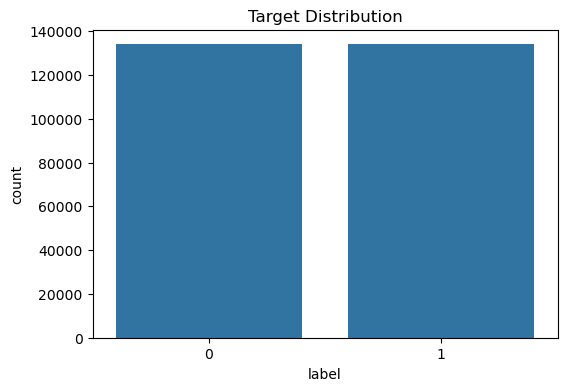

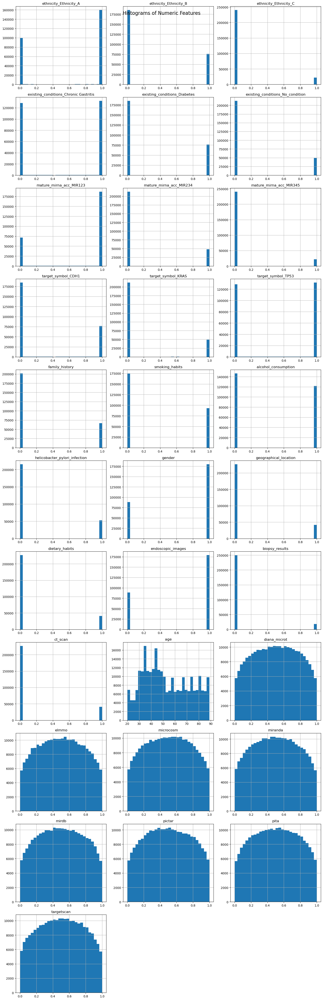

In [62]:
eda_summary_plots(x_train_resampled, y_train_resampled, target_name='label')


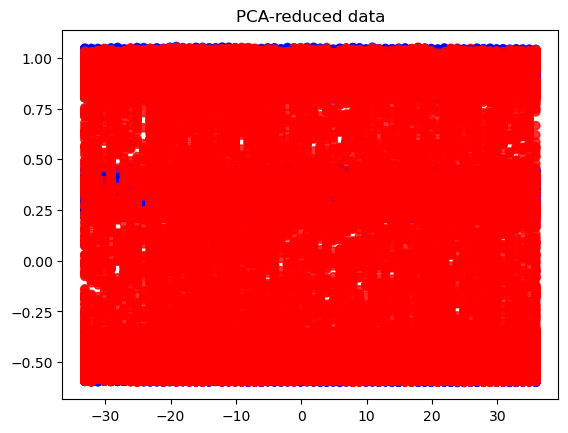

In [63]:
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(x_train_resampled)

plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y_train_resampled, cmap='bwr', alpha = 0.8)
plt.title("PCA-reduced data")
plt.show()

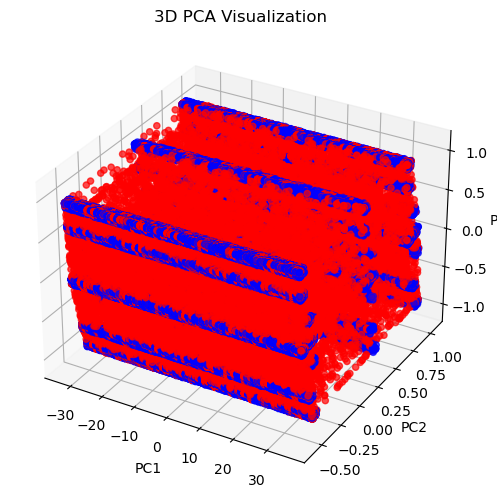

In [64]:
pca = PCA(n_components=3)
X_3d = pca.fit_transform(x_train_resampled)

# 3D Plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(X_3d[:, 0], X_3d[:, 1], X_3d[:, 2], c=y_train_resampled, cmap='bwr', alpha=0.7)
ax.set_title("3D PCA Visualization")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.show()

In [65]:
# Create DataFrame with PCA components and class labels
pca_df = pd.DataFrame(X_3d, columns=['PC1', 'PC2', 'PC3'])
pca_df['Class'] = y_train_resampled
#pca_df.to_csv('../datasets/pca/pca_df', index = False)

# THE DATA IS HEAVLY OVERLAPPING

### ✅ What we can do next:

Use models that can capture complex decision boundaries:

> DT

> Random Forest

> SVM with RBF kernel

> Gradient Boosting

> Neural Networks



## Trying DT

In [66]:
x_train_resampled50000 = x_train_resampled.iloc[:50000]
y_train_resampled50000 = y_train_resampled.iloc[:50000]
x_train_resampled50000.shape

(50000, 31)

[[20695  8014]
 [ 2191   953]]
Decesion Tree
Accuracy:  0.6796220136250902
Percission:  0.10627857700457231
Recall:  0.30311704834605596
F1:  0.15737759062009743


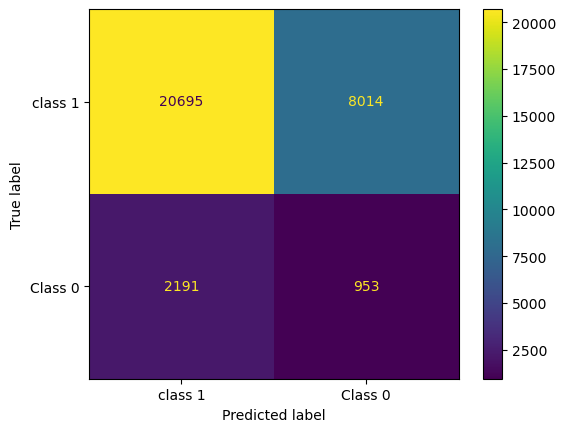

In [68]:
DT = DecisionTreeClassifier()
DT.fit(x_train_resampled,y_train_resampled)
y_pred = DT.predict(x_val)


accuracy = accuracy_score(y_val, y_pred)
Percission = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)


cm = confusion_matrix(y_val, y_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["class 1", "Class 0"])
disp.plot()


print("Decesion Tree")
print("Accuracy: ", accuracy)
print("Percission: ", Percission)
print("Recall: ", recall)
print("F1: ", f1)

## Trying Random Forest

[[25525  3184]
 [ 2786   358]]
Random Forest
Accuracy:  0.8125765234043889
Percission:  0.10107284020327499
Recall:  0.1138676844783715
F1:  0.10708944062219564


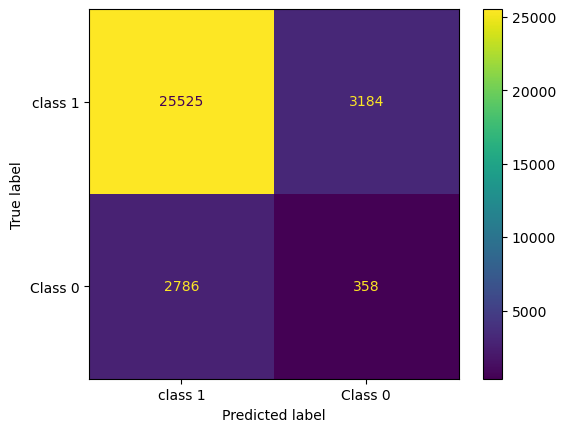

In [69]:
RF = RandomForestClassifier()
RF.fit(x_train_resampled,y_train_resampled)
y_pred = RF.predict(x_val)


accuracy = accuracy_score(y_val, y_pred)
Percission = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)


cm = confusion_matrix(y_val, y_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["class 1", "Class 0"])
disp.plot()


print("Random Forest")
print("Accuracy: ", accuracy)
print("Percission: ", Percission)
print("Recall: ", recall)
print("F1: ", f1)

## Trying SVC with RBF Kernel

In [ ]:
SVC = SVC(kernel='rbf', C=1, gamma='auto')

SVC.fit(x_train_resampled50000,y_train_resampled50000)
y_pred = SVC.predict(x_val_scaled)


accuracy = accuracy_score(y_val, y_pred)
Percission = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)


cm = confusion_matrix(y_val, y_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["class 1", "Class 0"])
disp.plot()


print("SVC with RBF Kernel")
print("Accuracy: ", accuracy)
print("Percission: ", Percission)
print("Recall: ", recall)
print("F1: ", f1)

## Now lets test the accuracy using multiple calssifiers to see whether the data is suitable for building the project or not

## Evaluating on different models

In [ ]:
logistic_regression = LogisticRegression()

logistic_regression.fit(x_train_resampled50000, y_train_resampled50000)
y_pred = logistic_regression.predict(x_val_scaled)



In [ ]:
def evaluate_models(x_train, x_test, y_train, y_test):
    models = {
        "Logistic Regression": LogisticRegression(max_iter=1000),
        "Random Forest": RandomForestClassifier(),
        "SVM": SVC(probability=True),
        "Naive Bayes": GaussianNB(),
        "Decision Tree": DecisionTreeClassifier(),
        "KNN": KNeighborsClassifier(),
        "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
    }

    results = []

    for name, model in models.items():
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        y_proba = model.predict_proba(x_test)[:, 1] if hasattr(model, "predict_proba") else None

        results.append({
            "Model": name,
            "Accuracy": accuracy_score(y_test, y_pred),
            "Precision": precision_score(y_test, y_pred, zero_division=0),
            "Recall": recall_score(y_test, y_pred, zero_division=0),
            "F1 Score": f1_score(y_test, y_pred, zero_division=0),
            "ROC AUC": roc_auc_score(y_test, y_proba) if y_proba is not None else "N/A"
        })

    return pd.DataFrame(results).sort_values(by="F1 Score", ascending=False)

In [ ]:
#models_results = evaluate_models(x_train_resampled_89317_rows, x_val_scaled, y_train_resampled__89317_rows, y_val)
#models_results